## necessary libraries

In [44]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import glob
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn as nn
from torch import optim 
import cv2 as cv
import numpy as np

plt.style.use('dark_background')
# plt.style.use('default')



## dataset Class

In [27]:
class Dataset(Dataset):

    # Constructor
    def __init__(self,transform=None):
        directory="/home/ishaq/Downloads/archive/images"
        positive="positive"
        negative="negative"

        positive_file_path=os.path.join(directory,positive)
        negative_file_path=os.path.join(directory,negative)
        positive_files=[os.path.join(positive_file_path,file) for file in  os.listdir(positive_file_path) if file.endswith(".jpg")]
        positive_files.sort()
        negative_files=[os.path.join(negative_file_path,file) for file in  os.listdir(negative_file_path) if file.endswith(".jpg")]
        negative_files.sort()
        number_of_samples = len(positive_files) + len(negative_files)

        #idx
        self.all_files=[None]*number_of_samples
        self.all_files[::2]=positive_files
        self.all_files[1::2]=negative_files 
        # The transform is goint to be used on image
        self.transform = transform
        #torch.LongTensor
        self.Y=torch.zeros([number_of_samples]).type(torch.LongTensor)
        self.Y[::2]=1
        self.Y[1::2]=0
        

        self.len=len(self.all_files)    
       
    # Get the length
    def __len__(self):
        return self.len
    
    def jus_img(self, idx):
        image=Image.open(self.all_files[idx])
        y=self.Y[idx]
        return image, y
    
    # Getter
    def __getitem__(self, idx):
        
        
        image=Image.open(self.all_files[idx])
        y=self.Y[idx]
          
        
        # If there is any transform method, apply it onto the image
        if self.transform:
            image = self.transform(image)

        return image, y

## custom CNN architecture

In [3]:
class CNN(nn.Module):
    
    # Contructor
    def __init__(self, out_1=96, out_2=256, number_of_classes=2):
        super(CNN, self).__init__()
        
        self.cnn1 = nn.Conv2d(in_channels=3, out_channels=out_1, kernel_size=11, stride=4)
        self.maxpool1=nn.MaxPool2d(kernel_size=3, stride=2)

        self.cnn2 = nn.Conv2d(in_channels=out_1, out_channels=out_2, kernel_size=5, padding=2)
        self.maxpool2=nn.MaxPool2d(kernel_size=3, stride=2)
        
        
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 13 * 13, 4096),
            nn.ReLU(inplace=True),
            
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            
            nn.Linear(4096, number_of_classes)
        )
    
    # Prediction
    def forward(self, x):
        x = self.cnn1(x)
        x = torch.relu(x)
        x = self.maxpool1(x)
        
        x = self.cnn2(x)
        x = torch.relu(x)
        x = self.maxpool2(x)
        
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

## AlexNet architecture

In [4]:
class AlexNet(nn.Module):
    def __init__(self, num_classes):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 96, kernel_size=11, stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            
            nn.Conv2d(96, 256, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            
            nn.Linear(4096, num_classes)
        )
        
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x



## transform object which contains transforming image to a Tensor, nomalizaing the data, and lastly resizing the images to (227,227) since the model is been trained with this size

In [ ]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
# transforms.ToTensor()
#transforms.Normalize(mean, std)
#transforms.Compose([])

target_size = (227, 227)
antialias = True 

# Create a transformation with the specified antialias parameter
resize_transform = transforms.Resize(target_size, antialias=antialias)

transform =transforms.Compose([ transforms.ToTensor(), transforms.Normalize(mean, std), transforms.Resize(target_size, antialias=antialias)])

## loading the pretrained modules

In [6]:
Alex_model = torch.load("Alex_model.pth")
CNN_model = torch.load("CNN_model.pth")

## dataset object

In [28]:
dataset = Dataset(transform=transform)
dataset[0]

(tensor([[[1.0885, 1.1108, 1.0996,  ..., 1.1774, 1.2194, 1.0265],
          [1.0848, 1.0607, 1.0512,  ..., 1.2542, 1.2440, 0.9824],
          [1.1040, 1.0384, 1.0120,  ..., 1.2663, 1.2758, 1.0084],
          ...,
          [1.0338, 1.0380, 1.0484,  ..., 1.1839, 1.2949, 1.2444],
          [1.0248, 1.0534, 1.0554,  ..., 1.1851, 1.3081, 1.1746],
          [0.9966, 1.0545, 1.0448,  ..., 1.2082, 1.3246, 1.1373]],
 
         [[1.2247, 1.2476, 1.2361,  ..., 1.3332, 1.3761, 1.1789],
          [1.2210, 1.1964, 1.1867,  ..., 1.4117, 1.4012, 1.1338],
          [1.2406, 1.1735, 1.1465,  ..., 1.4240, 1.4337, 1.1603],
          ...,
          [1.1688, 1.1731, 1.1838,  ..., 1.3398, 1.4533, 1.4016],
          [1.1597, 1.1889, 1.1909,  ..., 1.3410, 1.4667, 1.3303],
          [1.1308, 1.1900, 1.1800,  ..., 1.3646, 1.4836, 1.2922]],
 
         [[1.4066, 1.4294, 1.4179,  ..., 1.5495, 1.5922, 1.3959],
          [1.4029, 1.3784, 1.3687,  ..., 1.6276, 1.6172, 1.3510],
          [1.4225, 1.3556, 1.3288,  ...,

In [29]:
dataset[0][0].shape

torch.Size([3, 227, 227])

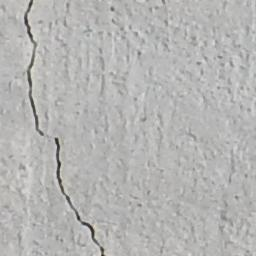

In [31]:
dataset.jus_img(0)[0]

## dataloader

In [9]:
dataloader = DataLoader(dataset, batch_size=1) 

# Testing 

## custom CNN model testing

In [78]:
labels=[]
N_test=len(dataset)
mis_clasi=[]
i=0

correct=0
for x_test,y_test in dataloader:
    z=CNN_model(x_test)
    _,yhat=torch.max(z.data,1)
    labels.append(yhat.item())
    correct += (yhat==y_test).sum().item()
    if not yhat==y_test:
        mis_clasi.append([dataset.jus_img(i)[0], yhat])
    i+=1
accuracy = correct/N_test
accuracy, correct, N_test

(0.8551587301587301, 862, 1008)

In [79]:
labels

[1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,


In [80]:
len(mis_clasi)

146

### the images that were misclassified

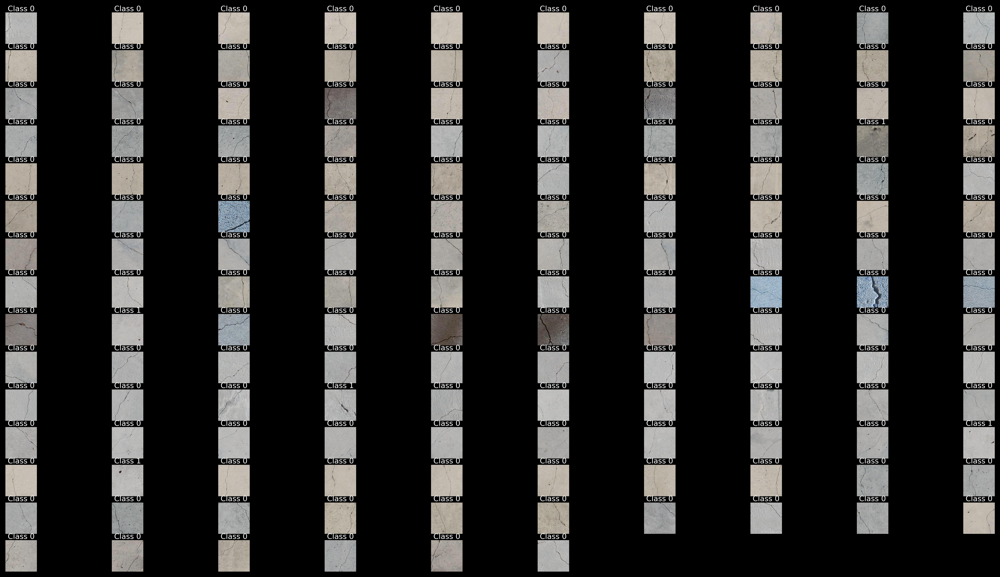

In [82]:
num_rows = 20 
num_cols = 10 

total_subplots = len(mis_clasi)

plt.figure(figsize=(25, 18), dpi=300)

# Loop through the kernels and plot them
for i in range(total_subplots):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(mis_clasi[i][0])
    plt.axis('off')
    
    # Add class label above the image
    plt.text(0.5, 1.05, f'Class {mis_clasi[i][1].item()}', ha='center', transform=plt.gca().transAxes)

plt.savefig("customCNN_misclassified_ones.png")

plt.show()


## AlexNet model testing

In [67]:
labels1=[]
mis_clasi1=[]
N_test1=len(dataset)
i=0
    
correct=0
for x_test,y_test in dataloader:
    z=Alex_model(x_test)
    _,yhat=torch.max(z.data,1)
    labels1.append(yhat.item())
    correct += (yhat==y_test).sum().item()
    if not yhat==y_test:
        mis_clasi1.append([dataset.jus_img(i)[0], yhat])
    i+=1
accuracy1 = correct/N_test1
accuracy1, correct, N_test1

(0.8035714285714286, 810, 1008)

In [68]:
labels1

[0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,


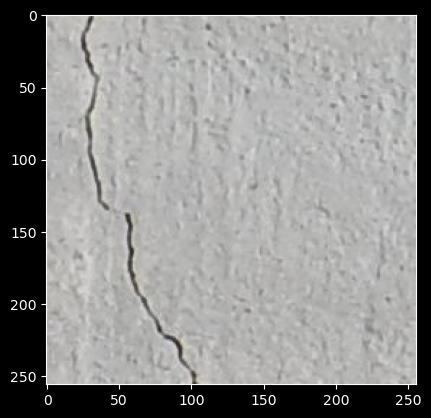

In [69]:
plt.imshow(mis_clasi1[0][0])

In [77]:
len(mis_clasi1)

198

### images that were misclassified

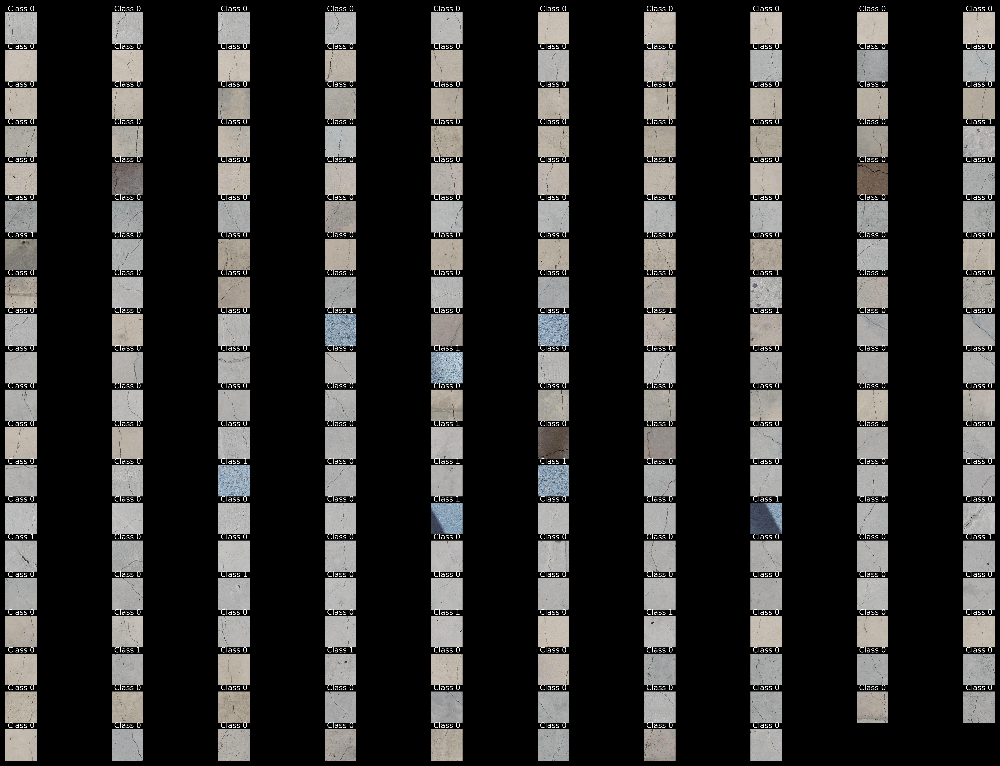

In [76]:

num_rows = 20 
num_cols = 10 

total_subplots = len(mis_clasi1)

plt.figure(figsize=(25, 18), dpi=300)

# Loop through the kernels and plot them
for i in range(total_subplots):
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(mis_clasi1[i][0])
    plt.axis('off')
    
    # Add class label above the image
    plt.text(0.5, 1.05, f'Class {mis_clasi1[i][1].item()}', ha='center', transform=plt.gca().transAxes)

plt.savefig("AlexNet_misclassified_ones.png")

plt.show()


# the reason the accuracy rates are down is becuase the images have a very thin cracks but the model was trained with the huge cracks